# Unit-wget model trained on MPI and Era
# Decoded response to filter single substitutions

## Southern California: storm 5 (December 10–13, 1995)
 





In [59]:
def calc_filter_variance(input_chunk, bn_mean_era, gen, ff):
    
    # avg_decoded: ERA
    generated_chunk = gen.decode(bn_mean_era).detach().numpy()
    avg_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    avg_decoded_denorm = generated_chunk_denorm[0]

    # front_encoded/decoded
    encoded_extreme = gen.encode(input_chunk)[0].detach()
    generated_chunk = gen.decode(encoded_extreme).detach().numpy()
    front_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    front_decoded_denorm = generated_chunk_denorm[0]

    # deviation from bottle neck mean
    newbn = encoded_extreme.clone()
    newbn[0,ff,:,:] = bn_mean_era[0,ff,:,:].clone()
    generated_chunk = gen.decode(newbn).detach().numpy()
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_chunk_denorm = generated_chunk_denorm[0]
    #err = float(mse(torch.tensor(generated_chunk_denorm), torch.tensor(front_decoded_denorm)).detach())
    #err18 = [round_sig(float(mse(torch.tensor(generated_chunk_denorm[ii]), torch.tensor(front_decoded_denorm[ii])).detach())) for ii in range(18)]
    err = float(mae(torch.tensor(generated_chunk[0]), torch.tensor(front_decoded)).detach())
    err18 = [round_sig(float(mae(torch.tensor(generated_chunk[0][ii]), torch.tensor(front_decoded[ii])).detach())) for ii in range(18)]
    #print('avg err:', err)
    #print('err18:', err18)
    #err1_list_era.append([err, [ff, generated_chunk.copy()]])

    return [err, err18, ff, front_decoded_denorm - generated_chunk_denorm]




STORM INDEX: 23


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  # This is added back by InteractiveShellApp.init_path()


FILTER 494


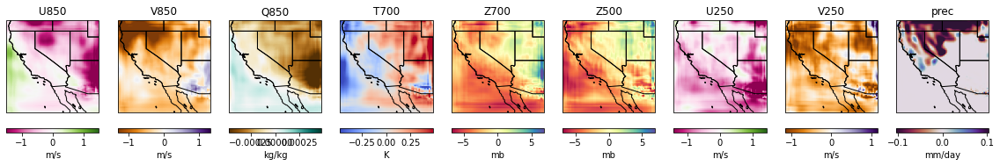

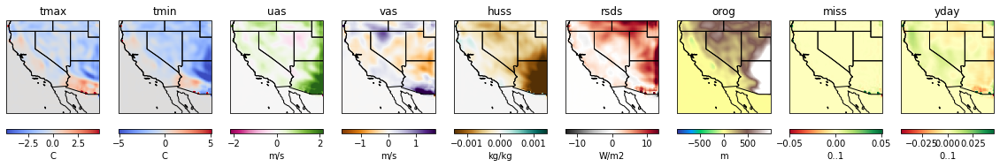

FILTER 412


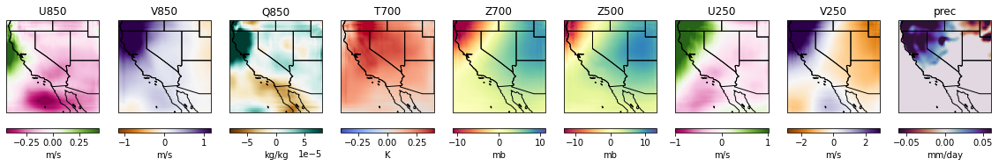

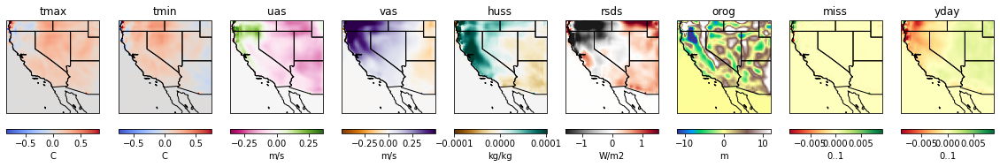

FILTER 152


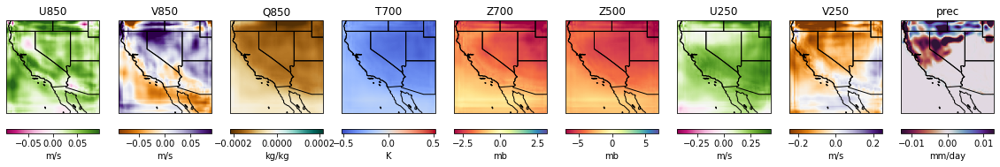

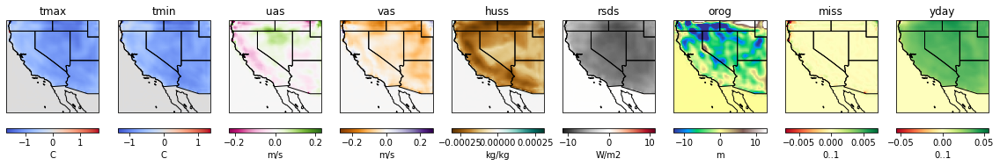

FILTER 15


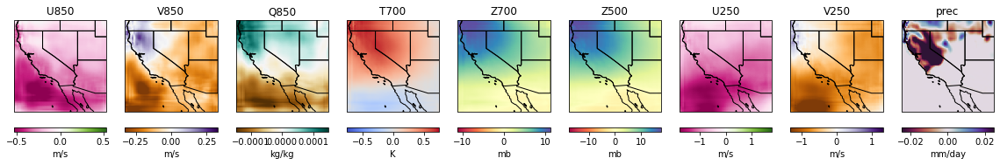

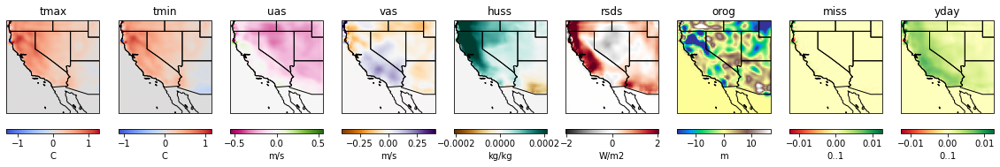

FILTER 410


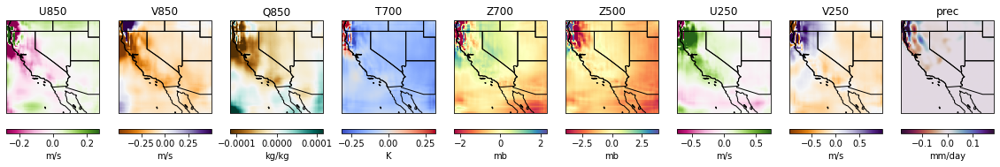

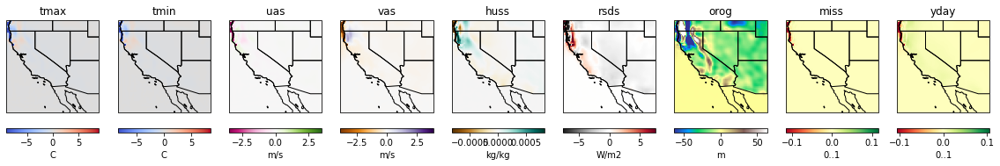

FILTER 151


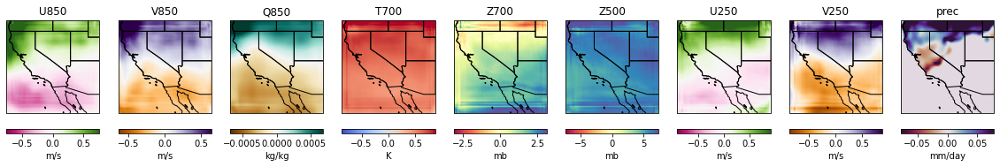

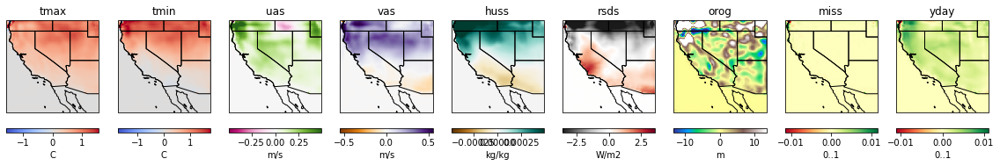

FILTER 77


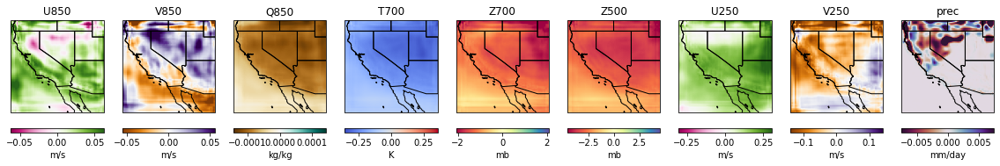

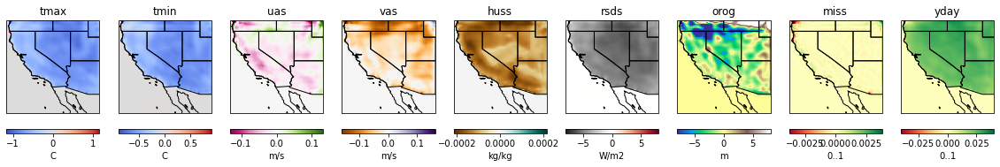

FILTER 456


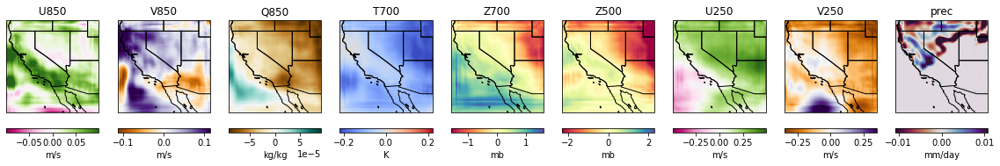

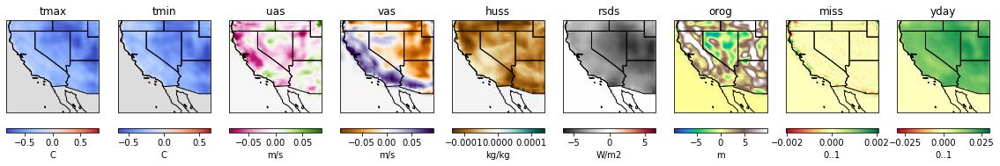

FILTER 222


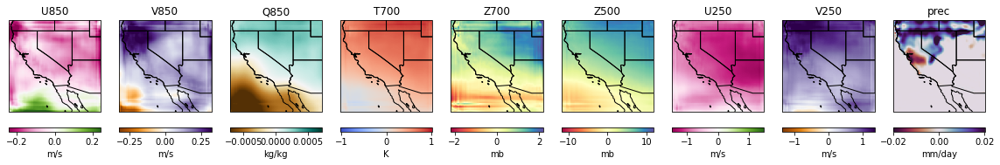

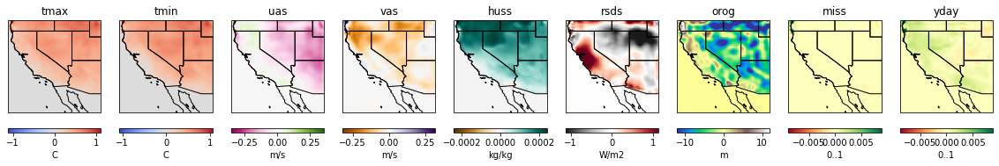

FILTER 56


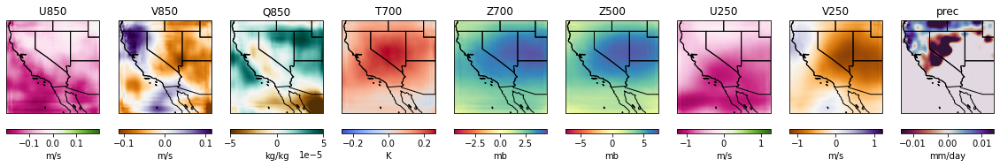

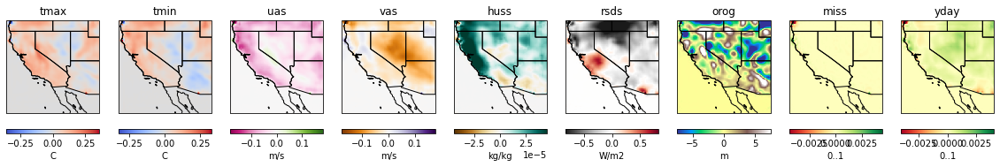

FILTER 505


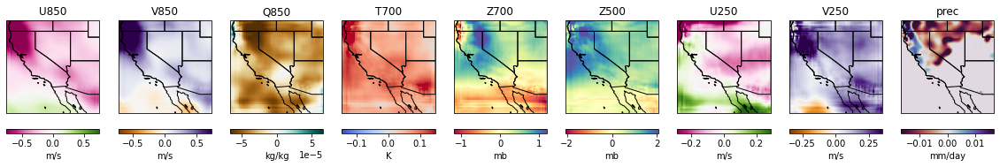

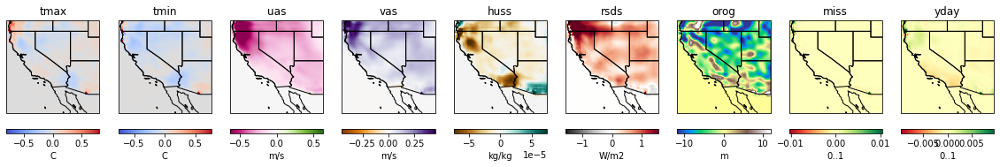

FILTER 313


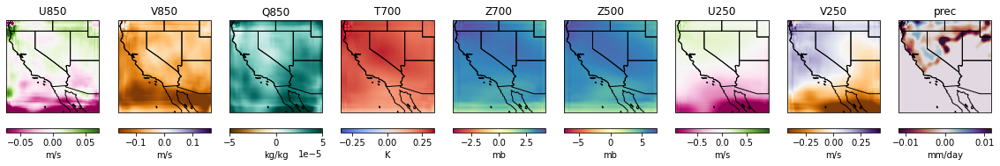

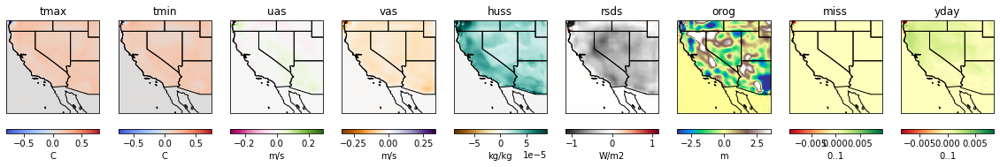

FILTER 446


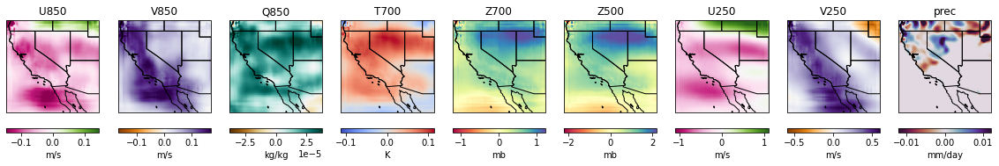

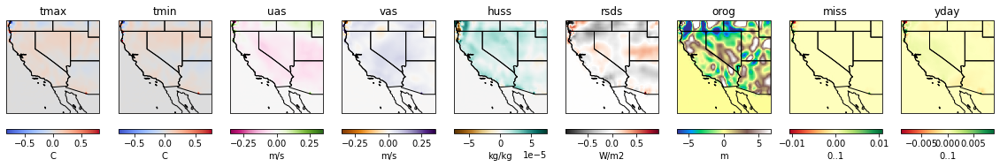

FILTER 156


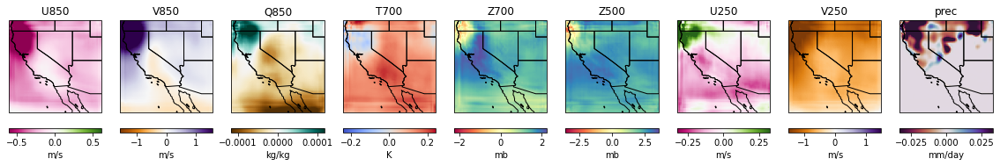

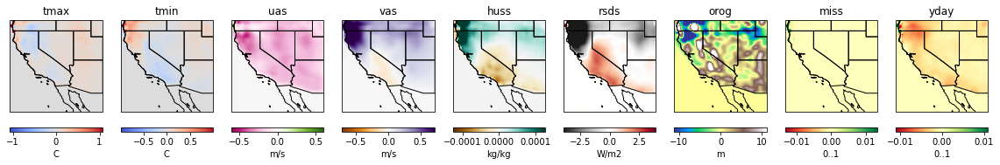

FILTER 323


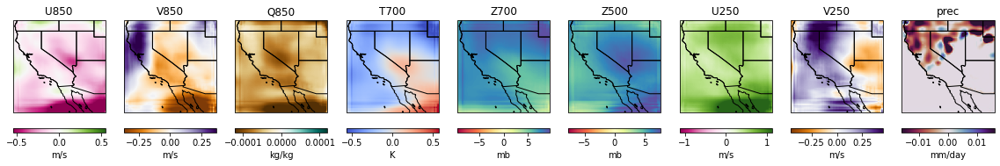

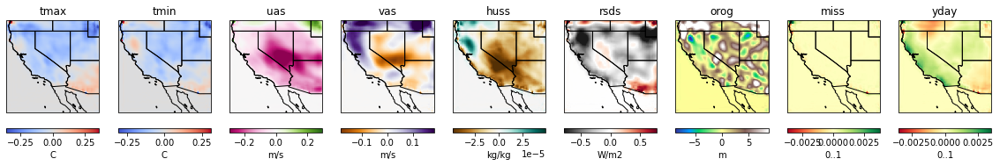


STORM INDEX: 24


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  # This is added back by InteractiveShellApp.init_path()


FILTER 494


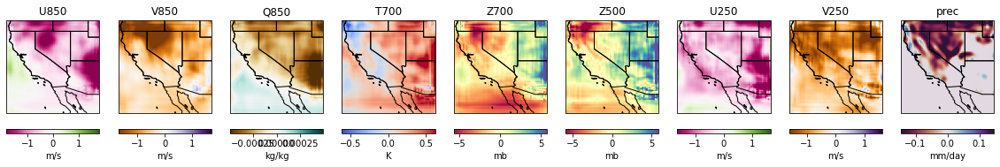

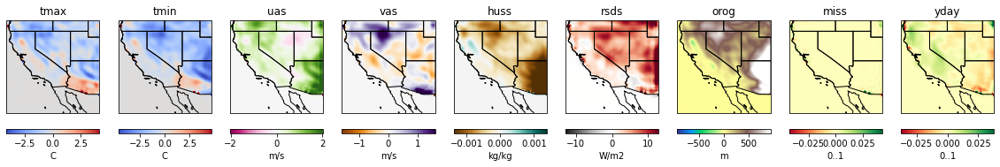

FILTER 412


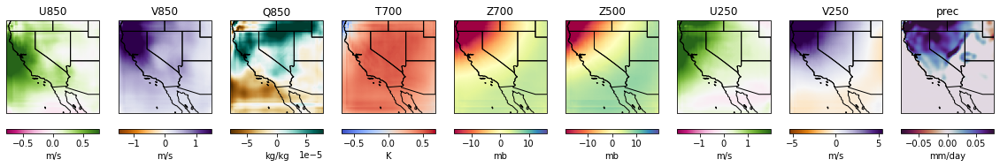

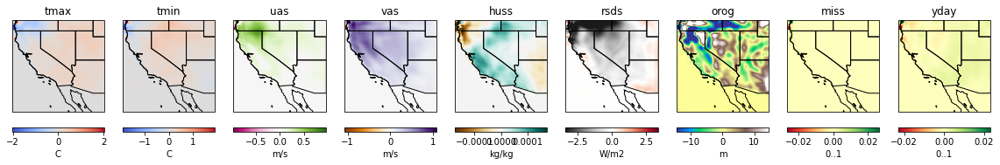

FILTER 152


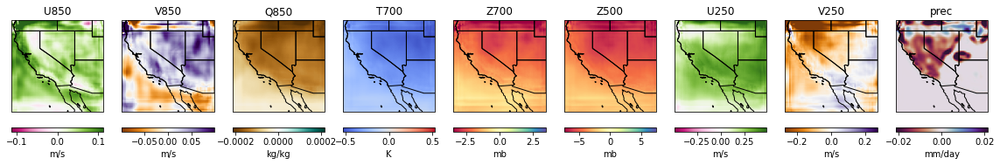

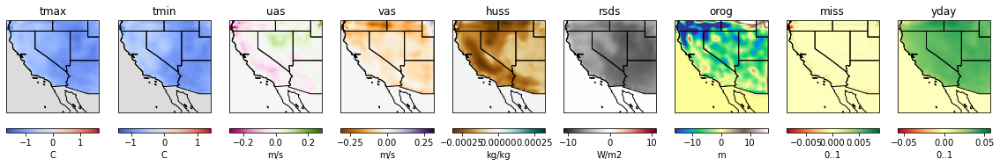

FILTER 15


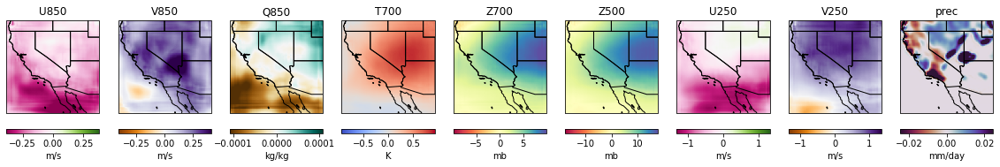

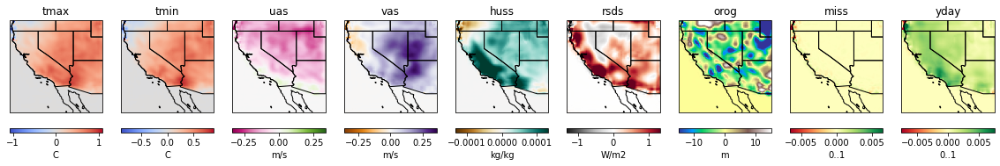

FILTER 410


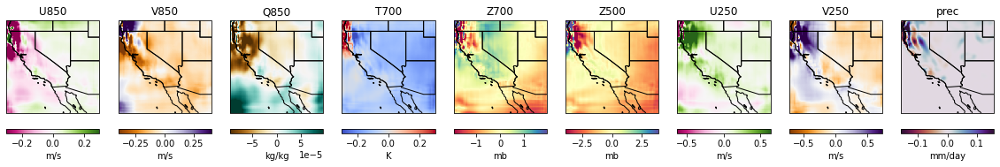

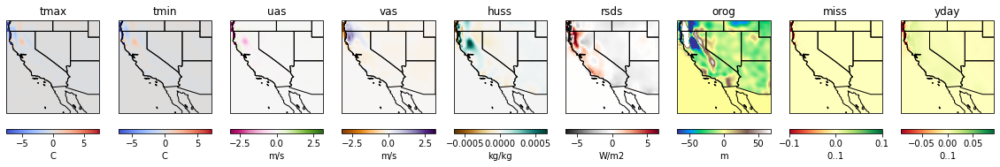

FILTER 151


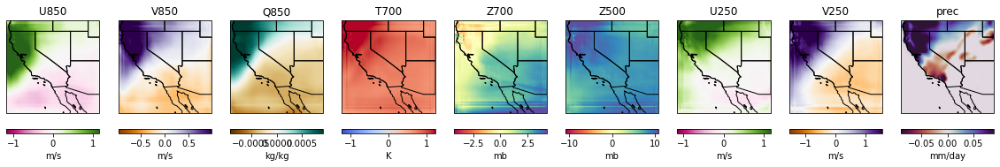

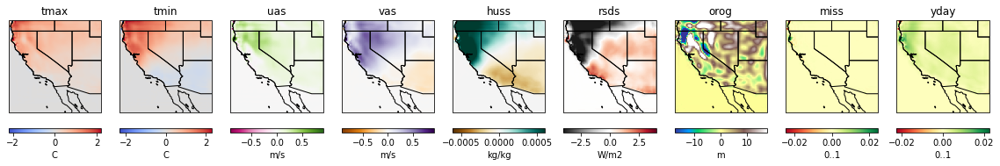

FILTER 77


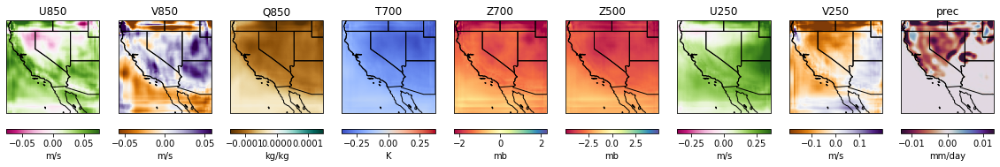

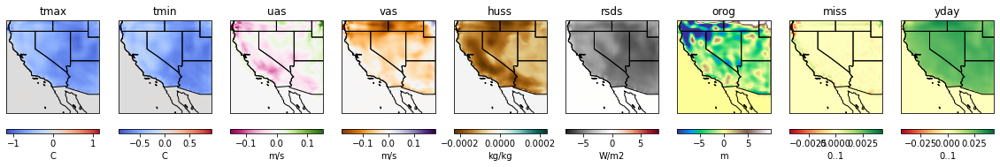

FILTER 456


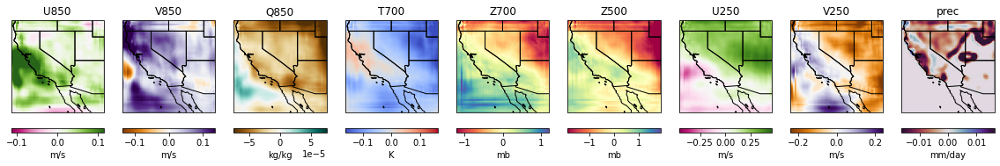

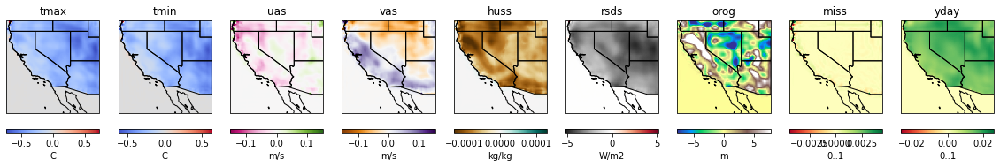

FILTER 222


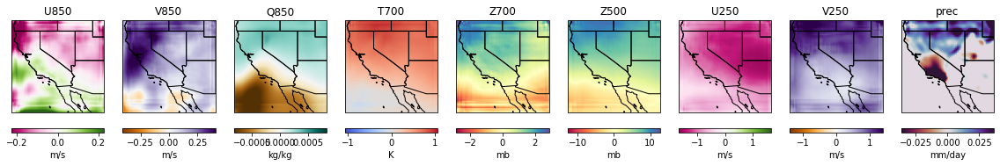

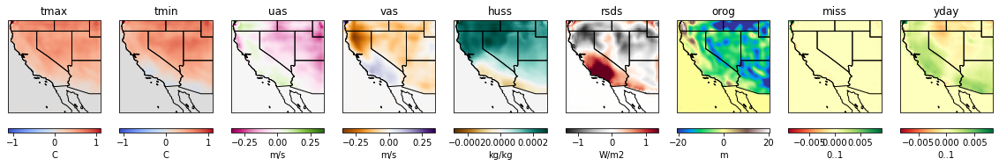

FILTER 56


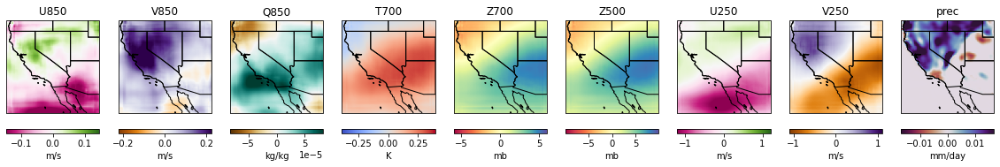

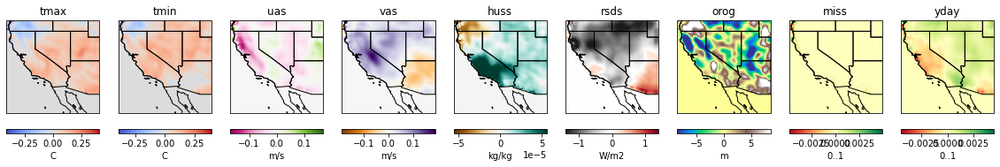

FILTER 505


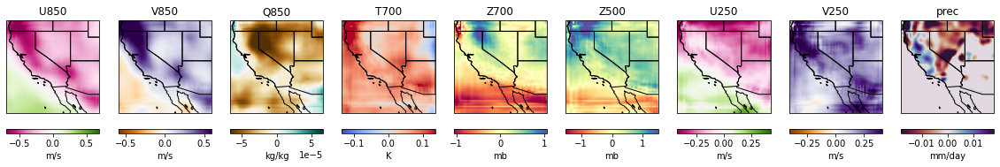

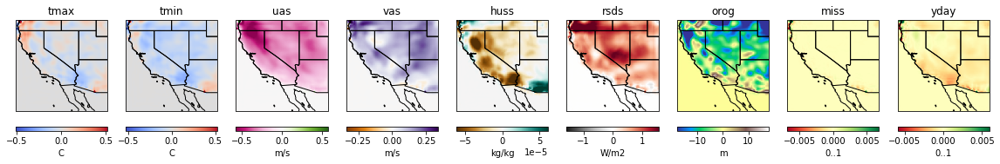

FILTER 313


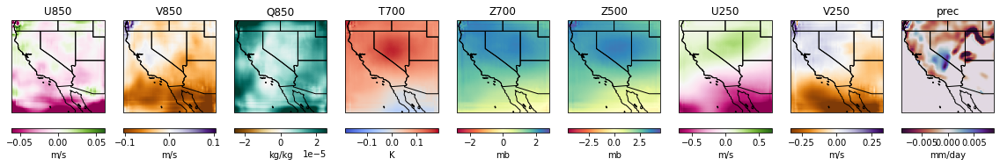

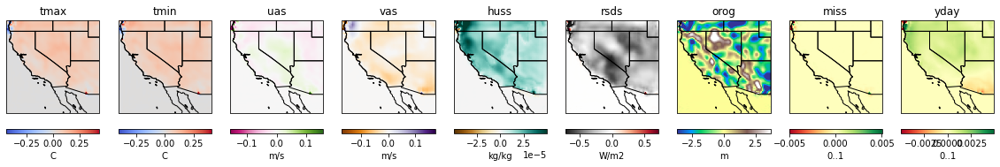

FILTER 446


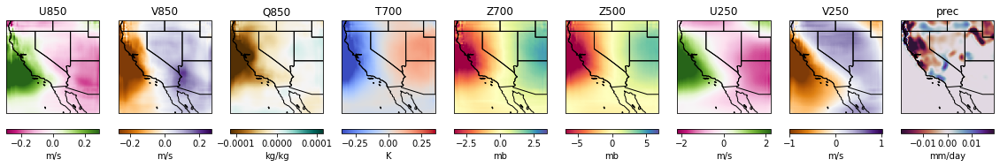

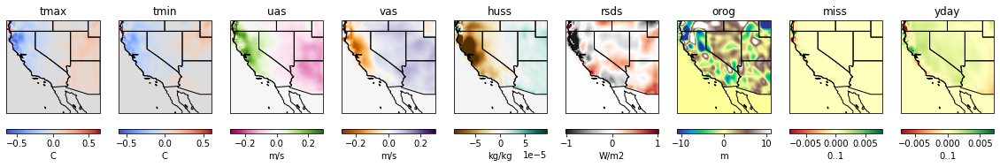

FILTER 156


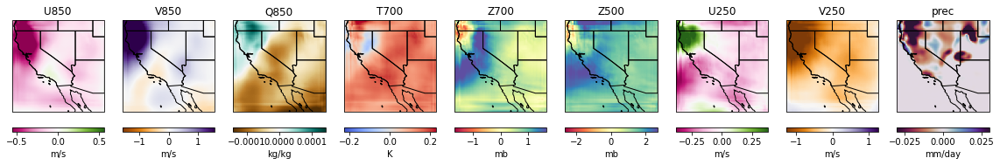

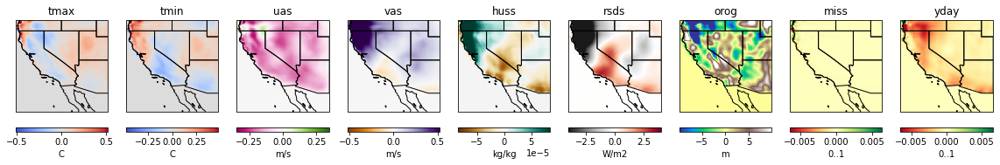

FILTER 323


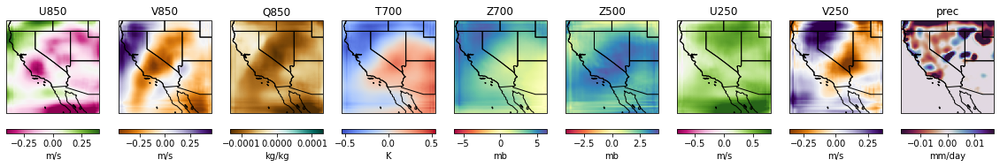

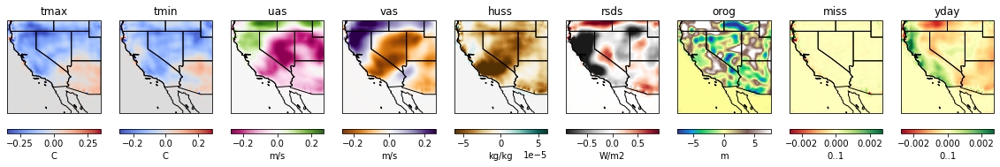


STORM INDEX: 25


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  # This is added back by InteractiveShellApp.init_path()


FILTER 494


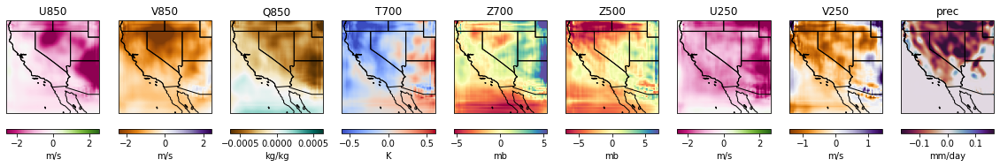

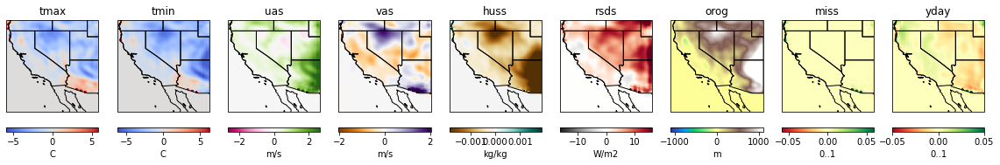

FILTER 412


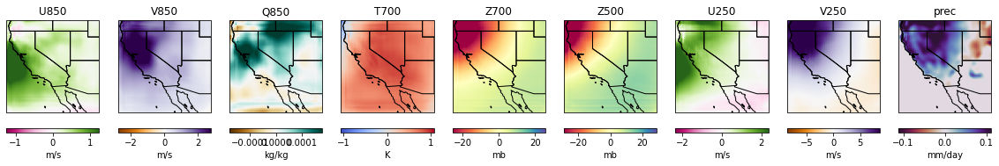

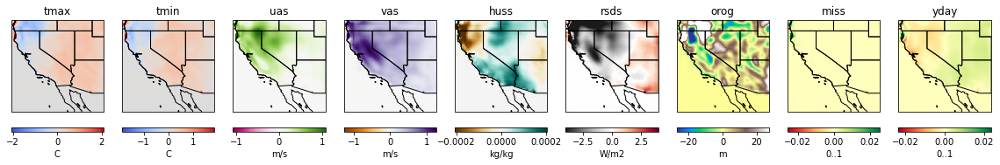

FILTER 152


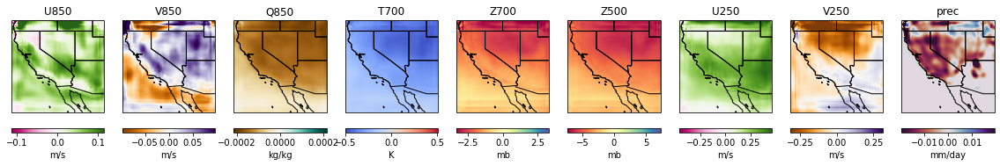

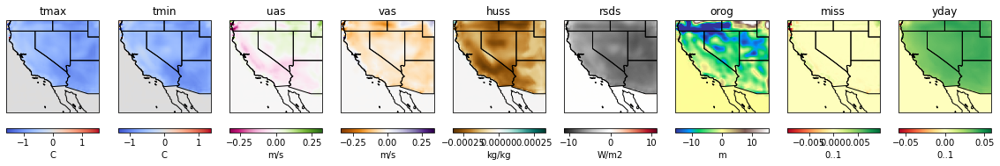

FILTER 15


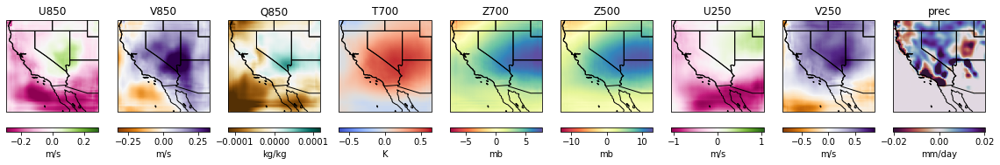

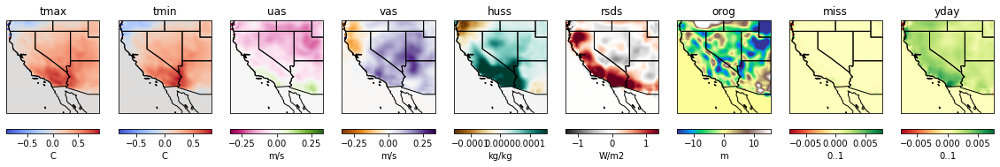

FILTER 410


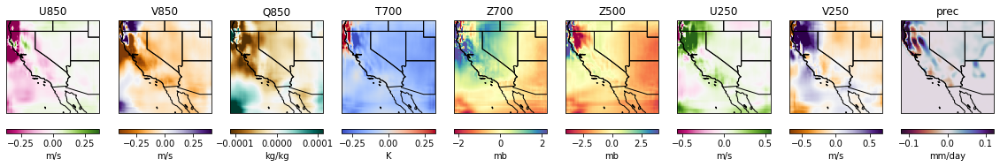

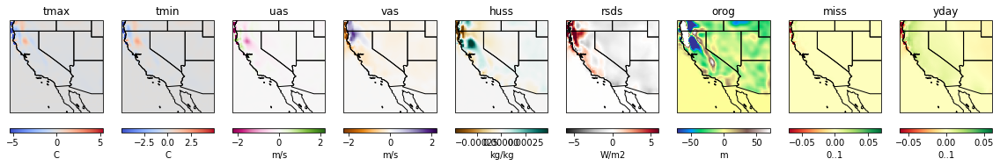

FILTER 151


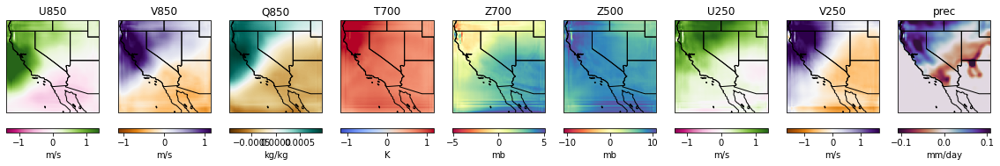

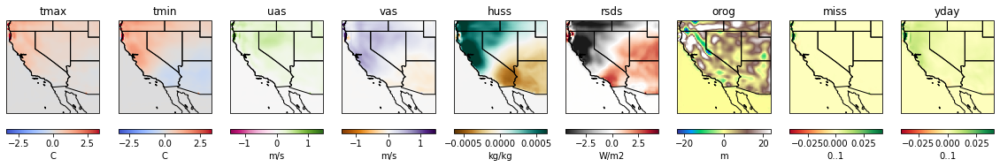

FILTER 77


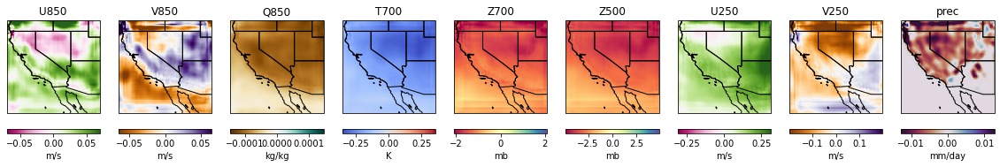

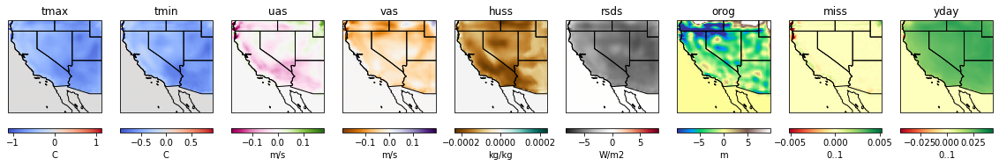

FILTER 456


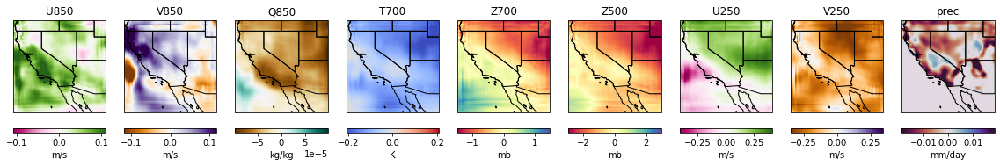

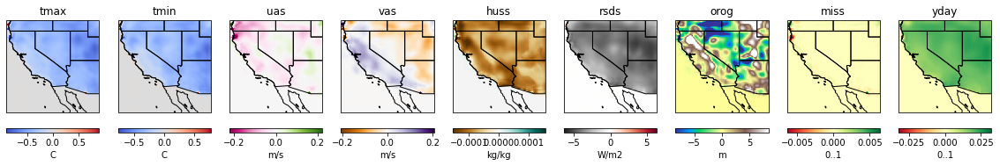

FILTER 222


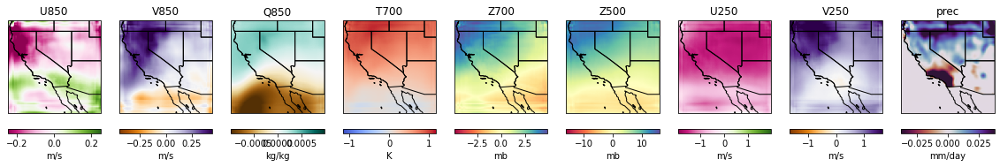

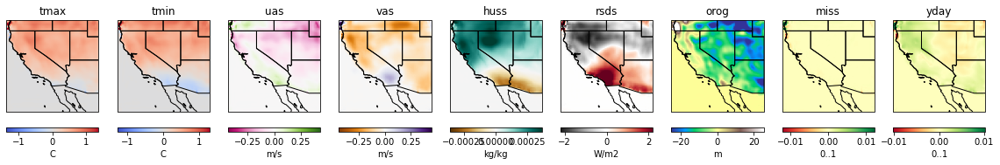

FILTER 56


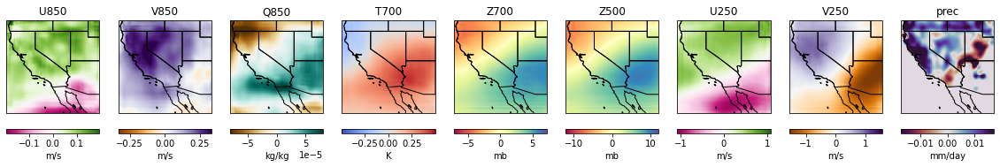

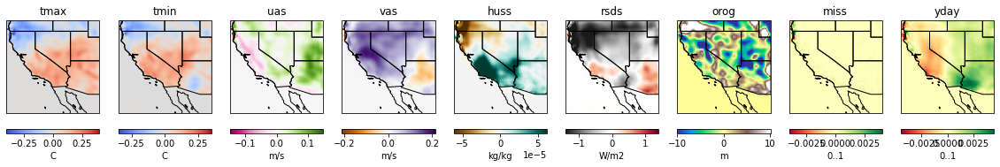

FILTER 505


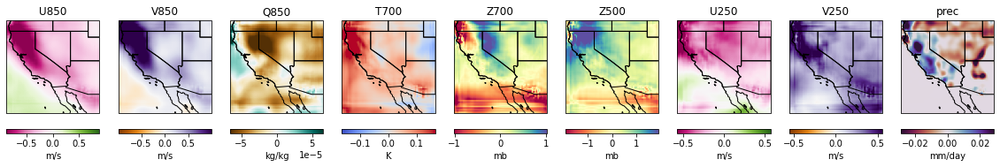

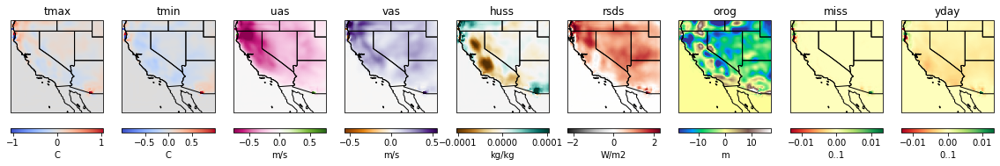

FILTER 313


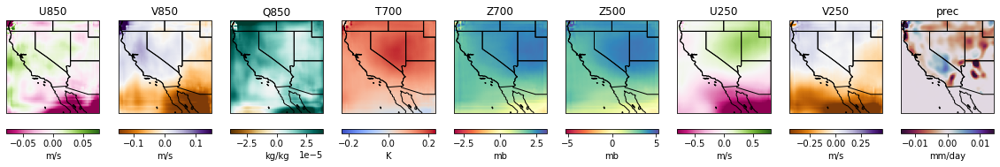

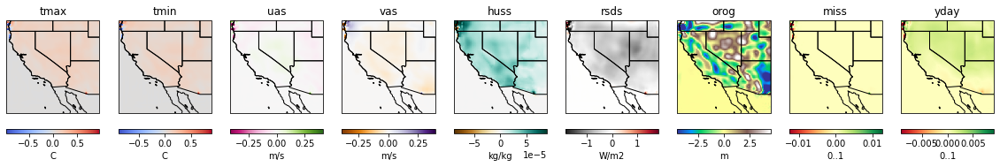

FILTER 446


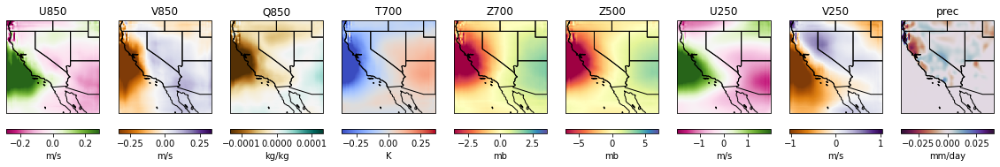

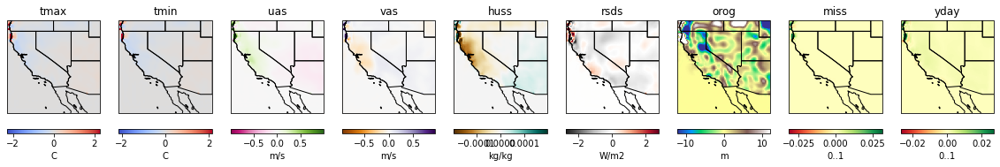

FILTER 156


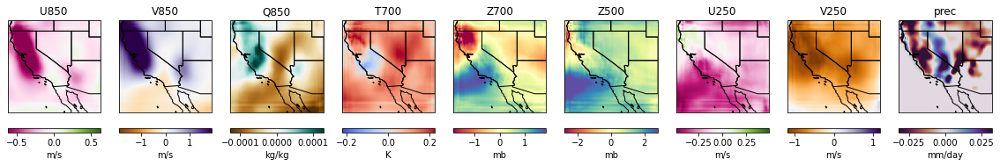

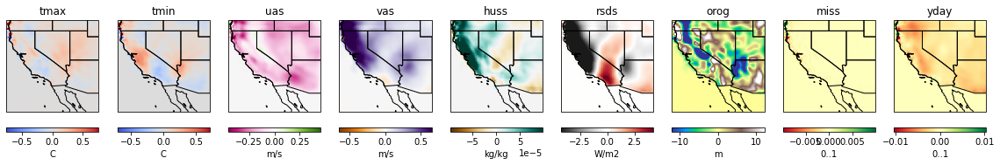

FILTER 323


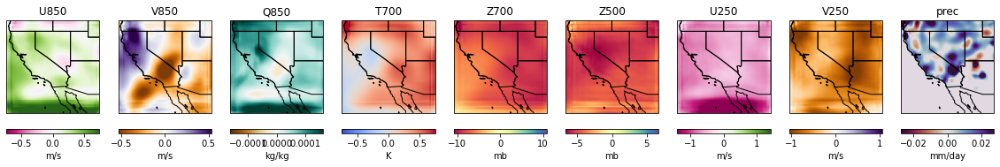

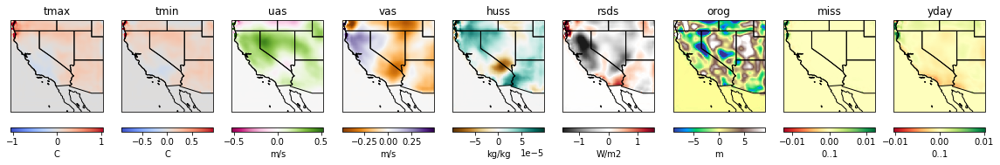

In [72]:
# substituting single filters from ERA day front)
varnames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250', 'prec', 'tmax', 'tmin', 'uas', 'vas', 'huss', 'rsds', 'orog','miss','yday']
#for ii in range(25):
#for ii in range(0,7):     # storm 1a and 1b
#for ii in range(7,10):     # storm 2
#for ii in range(10,14):     # storm 3
#for ii in range(14,23):     # storm 4
for ii in range(23,26):     # storm 5
    print('\nSTORM INDEX:', ii)
    input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
    input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom

    for fii in range(15):
        #xx = err1_list_era[top15_filters_era[fii]]
        ff= top15_filters_era[fii]
        xx = calc_filter_variance(input_chunk, bn_mean_era, gen_b, ff)

        vmax = [-9999 for y in range(18)]  
        vmin = [9999 for y in range(18)]           
        vmin_temp = [xx[3][ii].mean() - xx[3][ii].std()*2 for ii in range(18)]
        vmax_temp = [xx[3][ii].mean() + xx[3][ii].std()*2 for ii in range(18)]

        vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
        vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]


        print("FILTER", top15_filters_era[fii])
        svars = [0,1,2,3,4,5,6,7,8]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        svars = [9,10,11,12,13,14,15,16,17]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)


        #plot_9v_192x256_abs(avg_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)
        #svars = [8,9,10,11,12,13,14,15,16]
        #plot_9v_192x256_abs(front_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)
        #plot_9v_192x256_abs(avg_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)


